# Модель предсказания температуры в дуговой печи

Для оптимизации производственных расходов металлургическому комбинату ООО «Так закаляем сталь» необходимо уменьшить потребление электроэнергии на этапе обработки стали. 

Сталь обрабатывается в металлическом ковше вместимостью около 100 тонн. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами, установленными в крышке ковша. Из сплава выводится сера, добавлением примесей корректируется химический состав и отбираются пробы для достижения целевого химического состава и оптимальной температуры плавки.

Температура в ковше измеряется несколько раз на разных этах, также как и нагрев печи происходит несколько раз.

Построим модель, которая предскажет температуру стали.

In [1]:
%matplotlib inline
import lightgbm as lgb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import ydata_profiling

from catboost import CatBoostRegressor
from scipy import stats
from seaborn import heatmap

from sklearn.compose import make_column_transformer
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_absolute_error as mae
from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler

In [2]:
import warnings
warnings.filterwarnings("ignore")

## План работы

### Изучение датасетов.

Перед составлением плана откроем датасеты и познакомимся с их содержимым.

#### Датасет с замерами температуры

In [3]:
try:
    df_temp = pd.read_csv('datasets/data_temp_new.csv')
except:
    df_temp = pd.read_csv('/datasets/data_temp_new.csv')
df_temp.head()

,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0


Первый датасет содержит информацию с замерами температуры в печи на разных этапах с указанием номера партии обрабатываемого материала, посмотрим его профайл: 

In [4]:
ydata_profiling.ProfileReport(df_temp) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df_temp[df_temp['Температура'].isna()]

,key,Время замера,Температура
13927,2500,2019-08-10 14:13:11,NaN
13928,2500,2019-08-10 14:18:12,NaN
13929,2500,2019-08-10 14:25:53,NaN
13930,2500,2019-08-10 14:29:39,NaN
13932,2501,2019-08-10 14:49:15,NaN
...,...,...,...
18087,3241,2019-09-06 16:55:01,NaN
18088,3241,2019-09-06 17:06:38,NaN
18089,3241,2019-09-06 17:21:48,NaN
18090,3241,2019-09-06 17:24:44,NaN


У некоторых партий нет данных о замерах температуры, кроме того присутствуют аномальные темепературы ниже 1500 С (температура плавления стали), избавимся от данных для партий, в которыйх присутствуют такие данные.

In [6]:
invalid_batches = df_temp['key'][(df_temp['Температура'].isna())|(df_temp['Температура'] < 1500)].unique()

In [7]:
df_temp = df_temp[~df_temp['key'].isin(invalid_batches)]

#### Датасет с информацией о подаче электроэнергии

In [8]:
try:
    df_arc = pd.read_csv('datasets/data_arc_new.csv')
except:
    df_arc = pd.read_csv('/datasets/data_arc_new.csv')
df_arc.head()

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691


In [9]:
ydata_profiling.ProfileReport(df_arc) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В датасете есть аномальные отрицательные значения рекативной мощности, сильно искажающие отчет, избавимся от них.

In [10]:
df_arc[df_arc['Реактивная мощность'] < 0]

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
9780,2116,2019-07-28 02:22:08,2019-07-28 02:23:57,0.705344,-715.479924


In [11]:
df_arc[df_arc['key'] == 2216]

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
10218,2216,2019-07-31 08:10:25,2019-07-31 08:13:22,0.350622,0.244806
10219,2216,2019-07-31 08:15:06,2019-07-31 08:17:47,1.132738,0.829180
10220,2216,2019-07-31 08:20:52,2019-07-31 08:23:02,0.501758,0.329744
10221,2216,2019-07-31 08:24:10,2019-07-31 08:27:14,0.895604,0.575976
10222,2216,2019-07-31 08:28:44,2019-07-31 08:30:58,1.010785,0.748756


In [12]:
df_arc = df_arc[df_arc['key'] != 2116]

In [13]:
ydata_profiling.ProfileReport(df_arc) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Данные со значениями активной и реактивной мощности распределены нормально, также стоит отметить чёткую корреляцию между этими значениями.

#### Данные о подаче сыпучих материалов.

In [14]:
try:
    df_bulk = pd.read_csv('datasets/data_bulk_new.csv')
except:
    df_bulk = pd.read_csv('/datasets/data_bulk_new.csv')
df_bulk.head()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0


In [15]:
ydata_profiling.ProfileReport(df_bulk) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Датасет содержит информацию о количестве материалов, использованных для легирования стали. Как правило их количество в общем объёме материала не существенно, но теоретически может способствовать остыванию печи.

#### Данные о времени подачи сыпучих материалов.

In [16]:
try:
    df_bulk_time = pd.read_csv('datasets/data_bulk_time_new.csv')
except:
    df_bulk_time = pd.read_csv('/datasets/data_bulk_time_new.csv')
df_bulk_time.head()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:28:48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:24:31,NaN,2019-05-03 11:14:50,2019-05-03 11:10:43
1,2,NaN,NaN,NaN,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:53:30,NaN,2019-05-03 11:48:37,2019-05-03 11:44:39
2,3,NaN,NaN,NaN,2019-05-03 12:32:39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:27:13,NaN,2019-05-03 12:21:01,2019-05-03 12:16:16
3,4,NaN,NaN,NaN,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:58:00,NaN,2019-05-03 12:51:11,2019-05-03 12:46:36
4,5,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,2019-05-03 13:34:12,2019-05-03 13:30:47


#### Данные о подаче проволочных материалов.

In [17]:
try:
    df_wire = pd.read_csv('datasets/data_wire_new.csv')
except:
    df_wire = pd.read_csv('/datasets/data_wire_new.csv')
df_wire.head(10)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,99.109917,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,98.061600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,155.282394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,113.393279,9.143681,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,81.244796,12.376000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Данные о времени подачи проволочных материалов.

In [18]:
try:
    df_wire_time = pd.read_csv('datasets/data_wire_new.csv')
except:
    df_wire_time = pd.read_csv('/datasets/data_wire_new.csv')
df_wire_time.head()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Данные по использованию инертного газа.

In [19]:
try:
    df_gas = pd.read_csv('datasets/data_gas_new.csv')
except:
    df_gas = pd.read_csv('/datasets/data_gas_new.csv')
df_gas.head()

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


### Выводы по полученным данным:

1. Исходя из полученных данных датасет выглядит следующим образом: (замер температуры -- нагрев -- введение легирующего материала) x n -- замер температуры.

1. Для построения модели предсказания температуры будет обучаться модель регрессии.

1. Для модели регрессии предлагается использовать следующие параметры: 1) начальная температура, 2) суммарный объём энергии использованный для нагрева (сумма произведений активной мощности на длительность нагрева), 3) длительность техпроцесса.

1. Реактивная мощность сильно коррелирует с активной и её использование не повлияет на улучшение качества модели.

1. Для обучения модели будут отобраны партии, в которых присутствует хотя бы два измерения температуры, последнее измерение будет являться целевым признаком.

1. Необходимо уточнить размерность данных легирующих материалов и инертного газа и принять решение об их влиянии на остывание печи.

### Итоговый вывод:

На основании полученных разъяснений в модели регрессии будут использованы следующие параметры:
1. Конечная температура партии в качестве целевого признака;
1. Начальная температура партии, 
1. Объём активной энергии, потраченной на нагревание печи,
1. Продолжительность техпроцесса,
1. Суммарное количество сыпучих материалов,
1. Суммарное количество проволочных материалов,
1. Объём использованного инертного газа - в качестве параметров.

## Код решения 

### Подготовка данных

Объединим нужные нам данные в одном датасете.

#### Выберем данные с первой и последней температурой в партии.

In [20]:
temp_chunk = df_temp.groupby('key')['Температура'].agg(['first', 'last', 'count'])

Убедимся, что отобраны партиии, в которых есть хотя бы два измерения температуры.

In [21]:
temp_chunk = temp_chunk[temp_chunk['count'] >= 2][['first', 'last']]
temp_chunk.columns = ['first_temp', 'last_temp']
temp_chunk.head()

,first_temp,last_temp
key,,
1,1571.0,1613.0
2,1581.0,1602.0
3,1596.0,1599.0
4,1601.0,1625.0
5,1576.0,1602.0


In [22]:
temp_chunk

,first_temp,last_temp
key,,
1,1571.0,1613.0
2,1581.0,1602.0
3,1596.0,1599.0
4,1601.0,1625.0
5,1576.0,1602.0
...,...,...
2495,1570.0,1591.0
2496,1554.0,1591.0
2497,1571.0,1589.0


#### Выберем данные с длительностью техпроцесса.

In [23]:
duration_chunk = df_temp.groupby('key')['Время замера'].agg(['first', 'last'])

In [24]:
duration_chunk['duration'] = (pd.to_datetime(duration_chunk['last']) - pd.to_datetime(duration_chunk['first'])).dt.total_seconds()

In [25]:
duration_chunk = duration_chunk.drop(['first', 'last'], axis=1)
duration_chunk.head()

,duration
key,
1,1714.0
2,1265.0
3,1753.0
4,1220.0
5,1536.0


#### Выберем данные с объёмом затраченной энергии.

In [26]:
df_arc.head()

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691


In [27]:
period = (pd.to_datetime(df_arc['Конец нагрева дугой']) - pd.to_datetime(df_arc['Начало нагрева дугой'])).dt.total_seconds()

In [28]:
df_arc['period'] = period

In [29]:
df_arc['power'] = (df_arc['Активная мощность'] ** 2 + df_arc['Реактивная мощность'] ** 2) ** 0.5 * df_arc['period']

In [30]:
power_chunk = df_arc[['key', 'power']].groupby('key').agg('sum')[['power']]
power_chunk.head()

,power
key,
1,770.282114
2,481.760005
3,722.837668
4,683.455597
5,512.169934


#### Выберем данные с суммой сыпучих материалов.

In [31]:
df_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


Одни виды добавок используются на регулярной основе, другие очень редко, объединим эти добавки в 2 группы.

In [32]:
df_bulk = df_bulk.fillna(0)

In [33]:
df_bulk['bulk_main'] = df_bulk['Bulk 3'] + df_bulk['Bulk 4'] + df_bulk['Bulk 12'] + df_bulk['Bulk 14'] + df_bulk['Bulk 15']
df_bulk['bulk_extra'] = df_bulk['Bulk 11'] + df_bulk['Bulk 2'] + df_bulk['Bulk 5']  + df_bulk['Bulk 6'] + df_bulk['Bulk 7']\
+ df_bulk['Bulk 8'] + df_bulk['Bulk 9'] +  + df_bulk['Bulk 10'] + df_bulk['Bulk 11'] + df_bulk['Bulk 13']

In [34]:
bulk_chunk = df_bulk[['key', 'bulk_main', 'bulk_extra']]
bulk_chunk.set_index('key', inplace=True)
bulk_chunk.head()

,bulk_main,bulk_extra
key,,
1,553.0,0.0
2,582.0,0.0
3,544.0,0.0
4,595.0,0.0
5,584.0,0.0


#### Выберем данные с суммой проволочных материалов.

In [35]:
df_wire.set_index('key', inplace=True)
wire_chunk = df_wire.sum(axis=1)
wire_chunk = wire_chunk.to_frame()
wire_chunk.columns = ['wire_sum']
wire_chunk.head()

,wire_sum
key,
1,60.059998
2,96.052315
3,91.160157
4,89.063515
5,98.352796


#### Выберем данные о подаче инертного газа.

In [36]:
gas_chunk = df_gas
gas_chunk.set_index('key', inplace=True)
gas_chunk.columns = ['gas']
gas_chunk.head()

,gas
key,
1,29.749986
2,12.555561
3,28.554793
4,18.841219
5,5.413692


#### Объединим данные в одну таблицу.

In [37]:
df = pd.merge(temp_chunk, power_chunk, on='key', how='inner')

In [38]:
df = pd.merge(df, duration_chunk, on='key', how='inner')

In [39]:
df = pd.merge(df, bulk_chunk, on='key', how='inner')

In [40]:
df = pd.merge(df, wire_chunk, on='key', how='inner')

In [41]:
df = pd.merge(df, gas_chunk, on='key', how='inner')
df.head()

,first_temp,last_temp,power,duration,bulk_main,bulk_extra,wire_sum,gas
key,,,,,,,,
1,1571.0,1613.0,770.282114,1714.0,553.0,0.0,60.059998,29.749986
2,1581.0,1602.0,481.760005,1265.0,582.0,0.0,96.052315,12.555561
3,1596.0,1599.0,722.837668,1753.0,544.0,0.0,91.160157,28.554793
4,1601.0,1625.0,683.455597,1220.0,595.0,0.0,89.063515,18.841219
5,1576.0,1602.0,512.169934,1536.0,584.0,0.0,98.352796,5.413692


In [42]:
df.corr()

,first_temp,last_temp,power,duration,bulk_main,bulk_extra,wire_sum,gas
first_temp,1.000000,0.301882,-0.345598,0.210786,-0.110687,-0.041884,0.131581,0.036736
last_temp,0.301882,1.000000,0.255918,0.096126,0.290370,-0.202974,0.060496,0.059079
power,-0.345598,0.255918,1.000000,0.507242,0.451827,0.172299,0.092837,0.354231
duration,0.210786,0.096126,0.507242,1.000000,0.202978,0.291069,0.206743,0.439041
bulk_main,-0.110687,0.290370,0.451827,0.202978,1.000000,-0.132368,0.003973,0.230503
bulk_extra,-0.041884,-0.202974,0.172299,0.291069,-0.132368,1.000000,-0.009089,0.237137
wire_sum,0.131581,0.060496,0.092837,0.206743,0.003973,-0.009089,1.000000,0.216310
gas,0.036736,0.059079,0.354231,0.439041,0.230503,0.237137,0.216310,1.000000


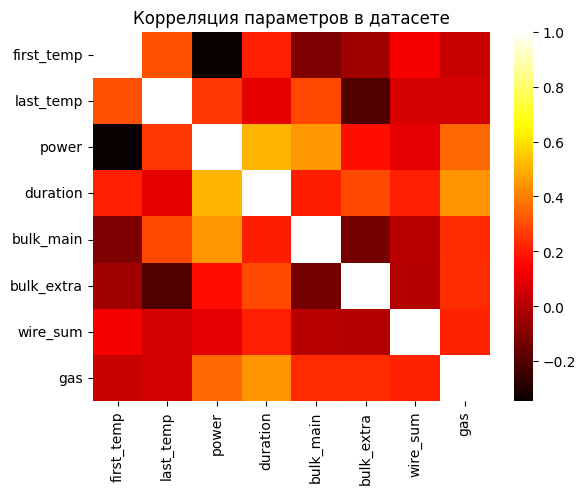

In [43]:
ax = plt.axes()
heatmap(df.corr(), cmap='hot',ax=ax)
ax.set_title('Корреляция параметров в датасете')
plt.show()

Параметры в наборе данных не имеют значимых корреляций.

Изучим полученную таблицу с параметрами.

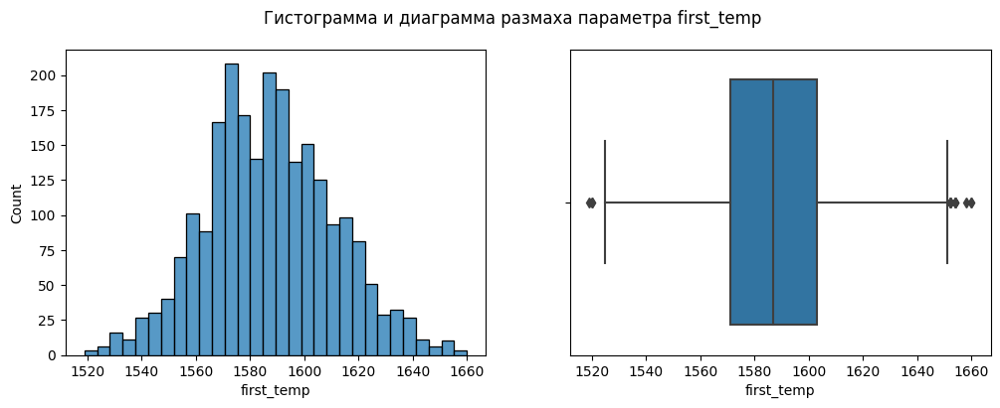

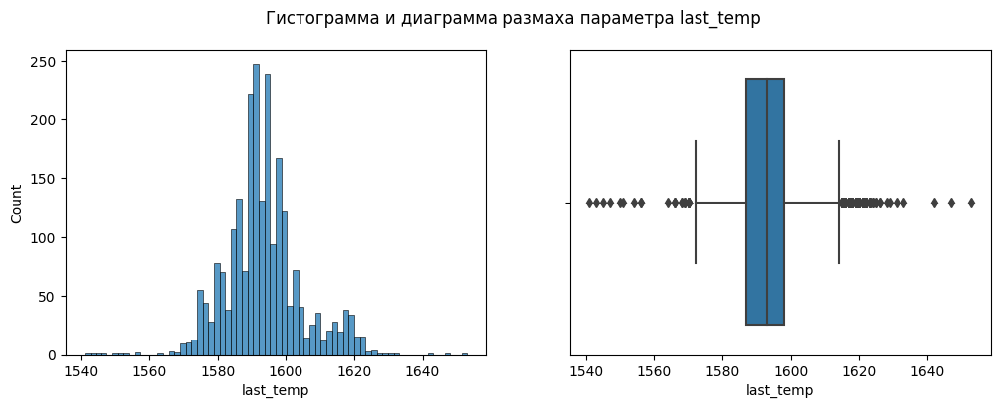

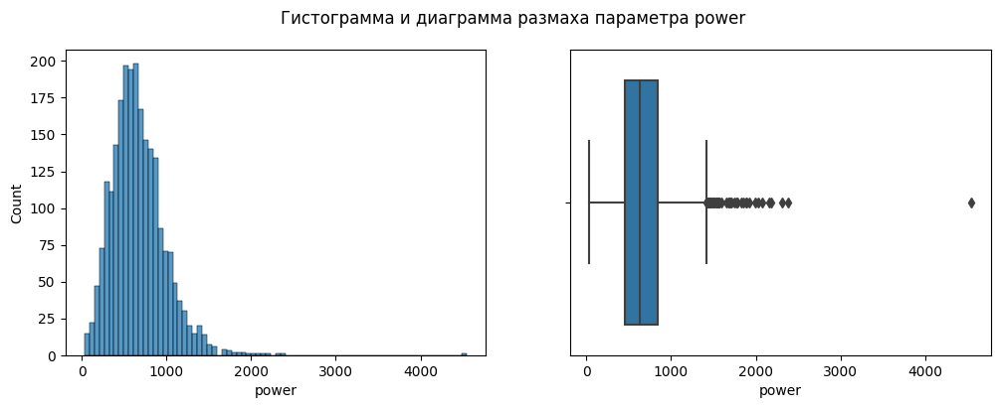

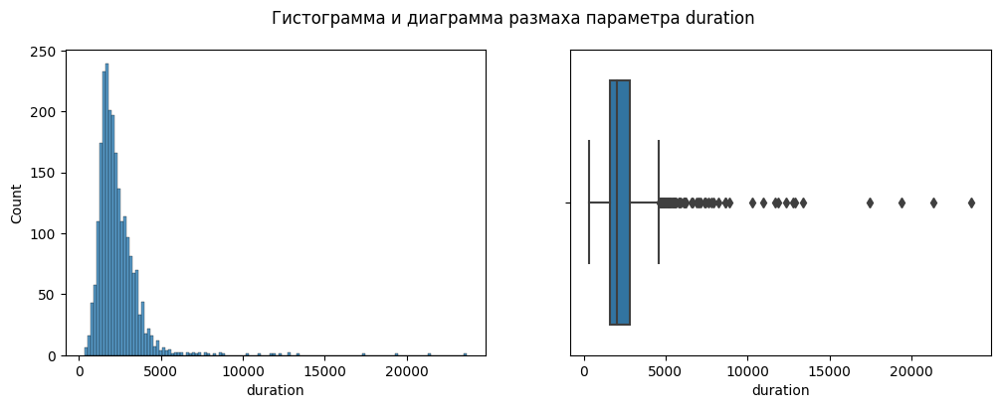

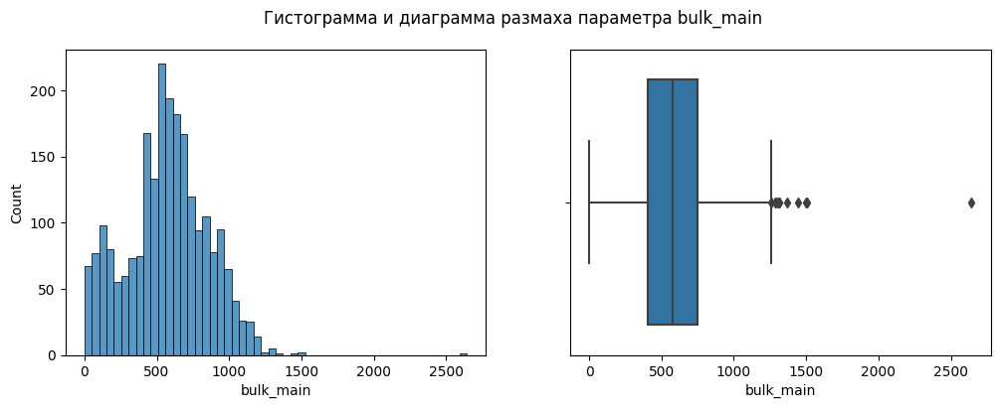

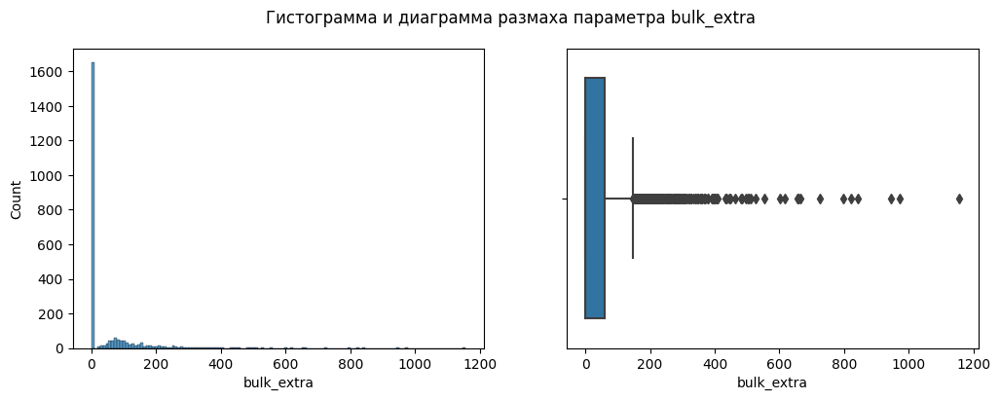

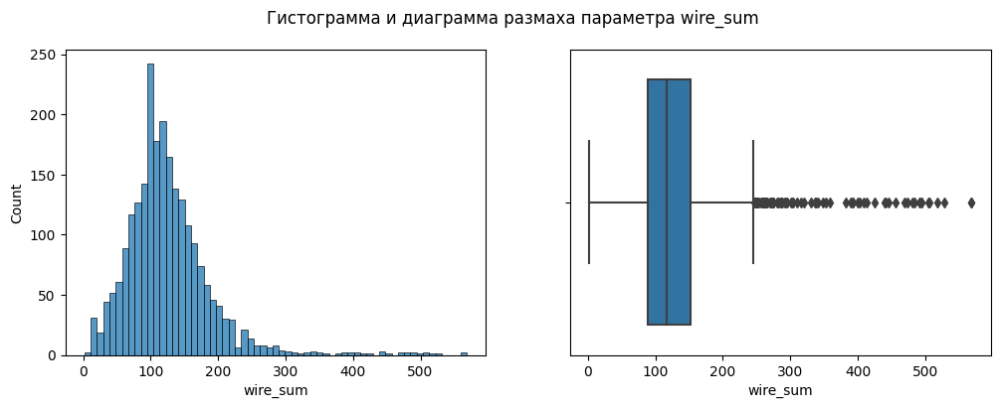

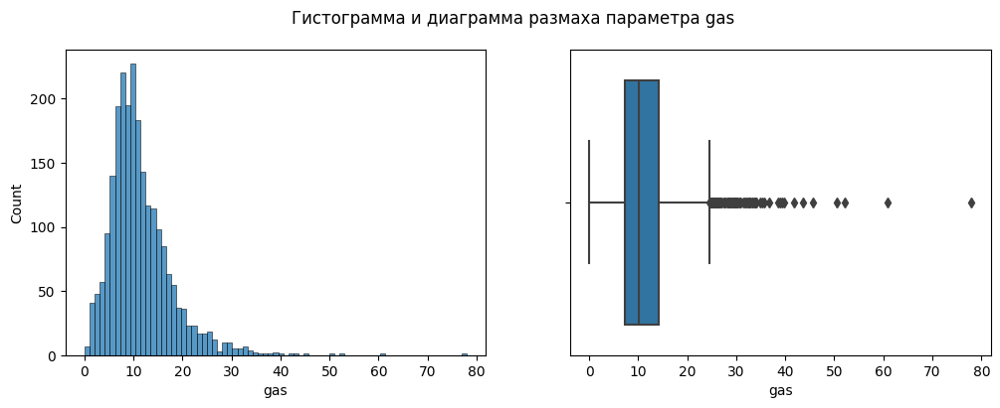

In [44]:
for col in df.columns:
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    fig.suptitle(f'Гистограмма и диаграмма размаха параметра {col}')
    sns.histplot(data=df, x=col, ax=ax[0])
    sns.boxplot(data=df, x=col, ax=ax[1]);

Во всех параметрах имеется некоторое количество выбросов, выбросы со значениями температуры показывают на аномально перегретое состояние печи, возможно это частные случаи тех процесса, когда не удаётся достигнуть нужного состояния сплава из-за некачественного сырья на входе. Будем учитывать эти выбросы в дальнейшей работе.

Отдельно можно сказать, данные по дополнительным добавкам не распределены нормально и практически все состоят из выбросов.

### Разделим данные на выборки

In [45]:
features = df.drop('last_temp', axis=1)
target = df['last_temp'] 

In [46]:
features_train, features_test, target_train, target_test = \
train_test_split(features, target, test_size=0.25, random_state=240423)

Избавимся от выбросов в обучающей выборке.

In [47]:
features_train.shape

(1743, 7)

In [48]:
features_train = features_train[(np.abs(stats.zscore(features_train)) < 3).all(axis=1)]

In [49]:
target_train = target_train[features_train.index]

In [50]:
target_train.shape

(1632,)

### Обучение моделей

#### Модель линейной регрессии

In [51]:
scaler = StandardScaler().fit(features_train)
x_train = scaler.transform(features_train)
x_test = scaler.transform(features_test)

In [52]:
model = LinearRegression()

print(f'''Значение метрики MAE на обучающей выборке для модели линейной регресси''',\
      cross_val_score(model, 
                      x_train, 
                      target_train,
                      cv = 5, 
                      n_jobs = -1,
                      scoring='neg_mean_absolute_error').mean())

Значение метрики MAE на обучающей выборке для модели линейной регресси -6.721217076848501


Метрика mae модели линейной регрессии показывает результат ниже целевого уровня.

#### Модель Ridge

In [53]:
num_features = features.columns.to_list()

In [54]:
col_transformer = make_column_transformer(
    (
        StandardScaler(), 
        num_features
    ),
    remainder='passthrough',
    verbose_feature_names_out=False
)

In [55]:
ridge_pipe = make_pipeline(col_transformer, Ridge())

ridge_params = {
    'ridge__alpha': np.logspace(-3, 3, 14),
}

ridge_grid = GridSearchCV(
    ridge_pipe, 
    param_grid=ridge_params, 
    scoring='neg_mean_absolute_error', 
    n_jobs=-1,
    verbose=False
)

In [56]:
%%time
ridge_grid.fit(features_train, target_train)

CPU times: user 164 ms, sys: 15.9 ms, total: 180 ms
Wall time: 695 ms


GridSearchCV(estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('standardscaler',
                                                                         StandardScaler(),
                                                                         ['first_temp',
                                                                          'power',
                                                                          'duration',
                                                                          'bulk_main',
                                                                          'bulk_extra',
                                                                          'wire_sum',
                                                                          'gas'])],
                                                          verbose_feature_names_out=False)),
                                       ('ridge', Ridge())]),
             n_jobs=-1,
             param_grid={'ridge__alpha': array([1.00000000e-03, 2.89426612e-03, 8.37677640e-03, 2.42446202e-02,
       7.01703829e-02, 2.03091762e-01, 5.87801607e-01, 1.70125428e+00,
       4.92388263e+00, 1.42510267e+01, 4.12462638e+01, 1.19377664e+02,
       3.45510729e+02, 1.00000000e+03])},
             scoring='neg_mean_absolute_error', verbose=False)

In [57]:
ridge_grid.best_score_

-6.699466982637659

#### Модель Light GBM

In [58]:
lgbm_model = lgb.LGBMRegressor(verbose=-1)

lgbm_params = {
    'n_estimators': [50, 100, 150],
    'num_leaves': [31, 41, 51],
    'min_child_samples': [5, 15],
    'max_depth': [4, 6, 10, 16, 24],
    'learning_rate': np.logspace(-3, -1, 5),
    'reg_alpha': np.logspace(-4, -2, 2)
                                           }

lgbm_grid = RandomizedSearchCV(lgbm_model,
                               lgbm_params,
                               #cv=crossval,
                               scoring='neg_mean_absolute_error',
                               n_iter=100,
                               random_state=240423)

In [59]:
%%time
lgbm_grid.fit(X=features_train, y=target_train)

CPU times: user 1min 48s, sys: 2.15 s, total: 1min 50s
Wall time: 28.4 s


RandomizedSearchCV(estimator=LGBMRegressor(verbose=-1), n_iter=100,
                   param_distributions={'learning_rate': array([0.001     , 0.00316228, 0.01      , 0.03162278, 0.1       ]),
                                        'max_depth': [4, 6, 10, 16, 24],
                                        'min_child_samples': [5, 15],
                                        'n_estimators': [50, 100, 150],
                                        'num_leaves': [31, 41, 51],
                                        'reg_alpha': array([0.0001, 0.01  ])},
                   random_state=240423, scoring='neg_mean_absolute_error')

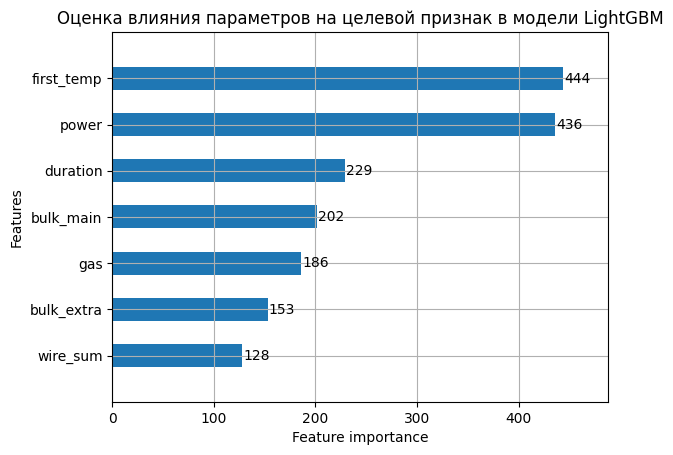

In [60]:
lgb.plot_importance(lgbm_grid.best_estimator_, height=.5, title='Оценка влияния параметров на целевой признак в модели LightGBM');

#### Модель Cat Boost

In [61]:
cat_model = CatBoostRegressor(loss_function='MAE',
                        silent=True)

cat_params = {'iterations': [50, 100],
        'learning_rate': np.logspace(-3, -1, 5),
        'depth': [d for d in range(10, 11)],
        'l2_leaf_reg': np.logspace(-1, 1, 3)
             }

cat_grid = RandomizedSearchCV(cat_model,
                        cat_params,
                        scoring='neg_mean_absolute_error',
                        n_iter=50,
                        random_state=240423)

In [62]:
%%time
cat_grid.fit(features_train, target_train);

CPU times: user 12min 45s, sys: 34.4 s, total: 13min 20s
Wall time: 2min 53s


RandomizedSearchCV(estimator=<catboost.core.CatBoostRegressor object at 0x7f40e0d8a640>,
                   n_iter=50,
                   param_distributions={'depth': [10], 'iterations': [50, 100],
                                        'l2_leaf_reg': array([ 0.1,  1. , 10. ]),
                                        'learning_rate': array([0.001     , 0.00316228, 0.01      , 0.03162278, 0.1       ])},
                   random_state=240423, scoring='neg_mean_absolute_error')

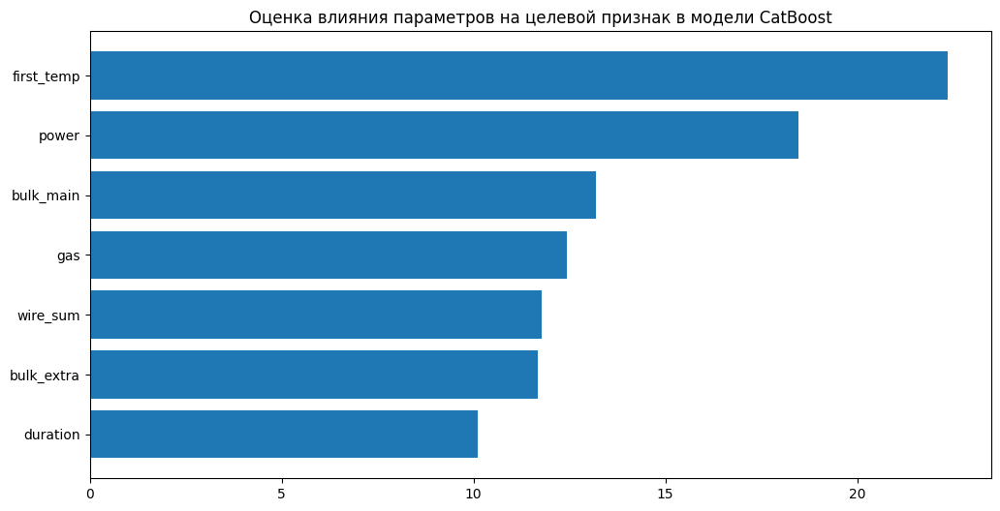

In [63]:
cat_imp = cat_grid.best_estimator_.feature_importances_
sorted_idx = np.argsort(cat_imp)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), cat_imp[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(features.columns)[sorted_idx])
plt.title('Оценка влияния параметров на целевой признак в модели CatBoost');

Разделение сыпучих добавок на 2 категории позволило улучшить результат и 2 модели подтверждают важность этих признаков, но с проволочными материалами это не работает.

### Выводы о важности признаков модели.

Обе модели градиентного бустинга указывают на то, что самыми важными параметрами влияющими на целевой признак являются изначальная температура и объём энергии затраченной на нагрев печи, важность остальных параметров примерно вдвое меньше.

### Анализ моделей

In [64]:
grids = [ridge_grid, lgbm_grid, cat_grid]

In [65]:
models_data = []
for grid in grids:
    # id модели с лучшими параметрами
    best_id = np.argmin(grid.cv_results_['rank_test_score'])
    models_data.append(
        [
            # лучшее значение метрики MAE на обучающей выборке
            (-grid.cv_results_['mean_test_score'][best_id]).round(3),
            # время обучения модели
            grid.cv_results_['mean_fit_time'][best_id].round(3),
            # время плучения предсказаний
            grid.cv_results_['mean_score_time'][best_id].round(3)
        ]
    ) 
models_df = pd.DataFrame(data=models_data,
                         index=['Ridge', 'LightGBM', 'CatBoost'],
                         columns=['лучшая MAE на обучающей выборке', 'время обучения модели', 'время получения предсказаний']
                        )
display(models_df)

,лучшая MAE на обучающей выборке,время обучения модели,время получения предсказаний
Ridge,6.699,0.009,0.004
LightGBM,6.689,0.031,0.002
CatBoost,6.760,1.485,0.002


Лучший результат метрики при обучении показала модель Cat Boost, посмотрим на ёё результаты на тестовой выборке.

In [66]:
mae(target_test, cat_grid.best_estimator_.predict(features_test)).round(1)

6.5

Значение метрики на целевом уровне.

## Отчёт по проделанной работе

Для оптимизации производственных расходов металлургическому комбинату ООО «Так закаляем сталь» необходимо уменьшить потребление электроэнергии на этапе обработки стали, для решения этой задачи предлагалось обучить модель регрессии со следующими параметрами:
1. Конечная температура как целевой признак;
2. Начальная температура,
3. Объём энергии, затраченной на нагревание,
4. Длительность техпроцесса - как параметры.

In [67]:
df_temp.head(10)

,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0
5,1,2019-05-03 11:30:38,1613.0
6,2,2019-05-03 11:34:04,1581.0
7,2,2019-05-03 11:38:40,1577.0
8,2,2019-05-03 11:46:09,1589.0
9,2,2019-05-03 11:49:38,1604.0


Данные по замерам температуры были разделены по партиям, поэтому для выделения параметров были выбраны первая и последняя темепратуры в партии, кроме того были отсеяны партии, у которых было меньше двух измерений температуры.

Аналогично, по времени крайних замеров температуры была определена длительность техпроцесса, включающая в себя не только периоды нагрева печи, но и все остальные этапы, в течение которых происходит остывание печи в атмосфере.

Объём энергии, затраченной на нагревание печи был рассчитан как сумма произведений активной мощности на период нагрева: 

In [68]:
df_arc.head(10)

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,period,power
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,228.0,84.616003
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438,185.0,166.928978
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460,172.0,124.276277
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979,365.0,234.630603
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691,148.0,159.830252
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.381124,0.220351,137.0,60.312695
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,0.261665,0.205527,338.0,112.463079
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.710297,0.484962,126.0,108.368056
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.786322,0.542517,210.0,200.616176
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.101678,0.820856,280.0,384.681584


Изначально, в виду корреляции значений активной и реактивной мощности, предлагалось использовать только активную мощность в качестве влияющего параметра, но в конечном итоге модель, использовавшая полную мощность показала более точные предсказания.

Параметр 'power' для модели был рассчитан по формуле:
$$
P = \sqrt{((p*t)^{2} + (q*t)^{2})}
$$

Модель не учитывает количество циклов нагрузки, только суммарный объём энергии.

После полученных разъяснений было решено добавить в модель количество используемых легирующих добавок и объём инертного газа, которым продувают печь.

В ходе исследовательского анализа было отмечено, что некоторые виды сыпучих и проволочных материалов используются на регулярной основе, а некоторые очень редко. В результате было решено разделить сыпучие материалы на основные и вспомогательные, а проволочные считать по общему количеству.

В пользу этого решения свидетельствовал инструмент по оценке важности признаков моделей Cat Boost и Light GBM, и конечная модель показала более точные предсказания.

Данные объединялись в общую таблицу внутренним способом, таким образом в неё вошли данные только о тех партиях, где нет пропущенных измерений.

Конечный датасет для обучения модели выглядел следующим образом:

In [69]:
df

,first_temp,last_temp,power,duration,bulk_main,bulk_extra,wire_sum,gas
key,,,,,,,,
1,1571.0,1613.0,770.282114,1714.0,553.0,0.0,60.059998,29.749986
2,1581.0,1602.0,481.760005,1265.0,582.0,0.0,96.052315,12.555561
3,1596.0,1599.0,722.837668,1753.0,544.0,0.0,91.160157,28.554793
4,1601.0,1625.0,683.455597,1220.0,595.0,0.0,89.063515,18.841219
5,1576.0,1602.0,512.169934,1536.0,584.0,0.0,98.352796,5.413692
...,...,...,...,...,...,...,...,...
2495,1570.0,1591.0,694.177326,1380.0,629.0,90.0,89.150879,7.125735
2496,1554.0,1591.0,815.818538,1705.0,674.0,122.0,114.179527,9.412616
2497,1571.0,1589.0,823.020520,962.0,665.0,0.0,103.134723,6.271699


В полученном наборе данных не было выявлено значимых корреляций между параметрами.

In [70]:
df.corr()

,first_temp,last_temp,power,duration,bulk_main,bulk_extra,wire_sum,gas
first_temp,1.000000,0.301882,-0.345598,0.210786,-0.110687,-0.041884,0.131581,0.036736
last_temp,0.301882,1.000000,0.255918,0.096126,0.290370,-0.202974,0.060496,0.059079
power,-0.345598,0.255918,1.000000,0.507242,0.451827,0.172299,0.092837,0.354231
duration,0.210786,0.096126,0.507242,1.000000,0.202978,0.291069,0.206743,0.439041
bulk_main,-0.110687,0.290370,0.451827,0.202978,1.000000,-0.132368,0.003973,0.230503
bulk_extra,-0.041884,-0.202974,0.172299,0.291069,-0.132368,1.000000,-0.009089,0.237137
wire_sum,0.131581,0.060496,0.092837,0.206743,0.003973,-0.009089,1.000000,0.216310
gas,0.036736,0.059079,0.354231,0.439041,0.230503,0.237137,0.216310,1.000000


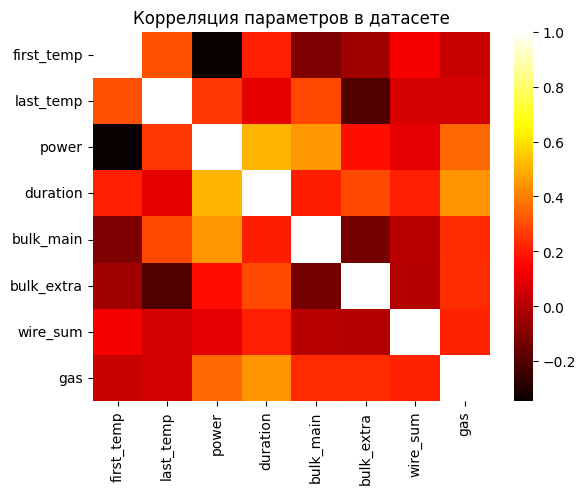

In [71]:
ax = plt.axes()
heatmap(df.corr(), cmap='hot',ax=ax)
ax.set_title('Корреляция параметров в датасете')
plt.show()

Далее выборка была разделена на обучающую и тестовую (в соотношении 75/25), причём обучающая выборка была очищена от выбросов.

In [72]:
features_train.shape

(1632, 7)

In [73]:
target_test.shape

(581,)

На полученной обучающей выборке были обучены модель линейной регрессии, модель Ridge с полным перебором параметров и модели с градиентным бустингом Cat Boost и Light GBM со случайным перебором параметров.

Лучший результат на обучающей выборке показала модель Cat Boost со следующими параметрами:

In [74]:
cat_grid.best_params_

{'learning_rate': 0.03162277660168379,
 'l2_leaf_reg': 10.0,
 'iterations': 100,
 'depth': 10}

Для улучшения модели на данном этапе можно применить полный перебор изначального набора гиперпараметров, либо осуществить перебор параметров, близких к параметрам модели показавшей наилучший результат.

Обе модели градиентного бустинга несколько по-разному оценивают важность влияния параметров модели.

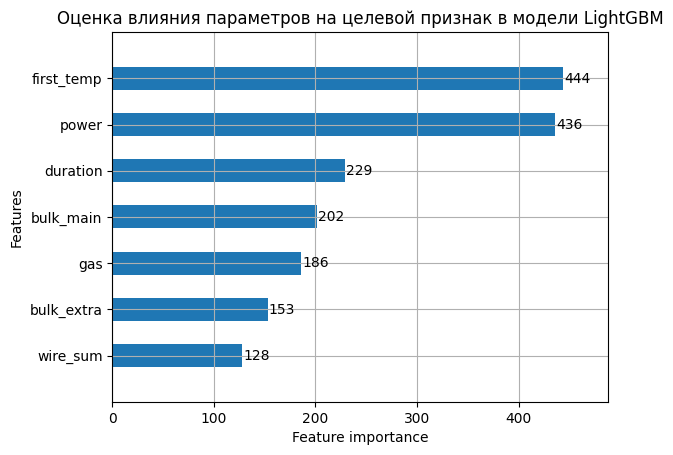

In [75]:
lgb.plot_importance(lgbm_grid.best_estimator_, height=.5, title='Оценка влияния параметров на целевой признак в модели LightGBM');

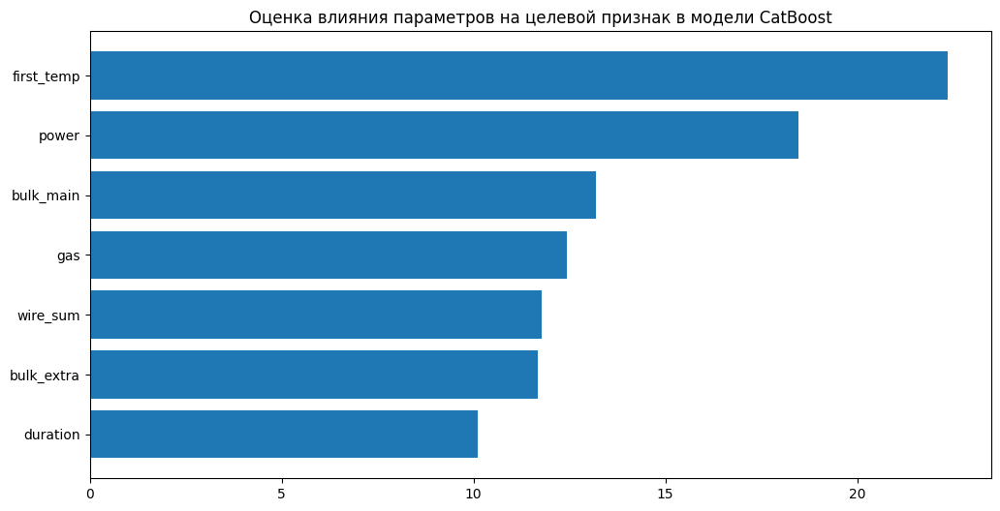

In [76]:
cat_imp = cat_grid.best_estimator_.feature_importances_
sorted_idx = np.argsort(cat_imp)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), cat_imp[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(features.columns)[sorted_idx])
plt.title('Оценка влияния параметров на целевой признак в модели CatBoost');

В обеих моделях самым важным признаком является изначальная температура процесса, из чего можно сделать закономерный вывод, что для качественного прогнозирования температуры в печи на выходе надо обеспечить стабильную температуру на входе, т.е. в самом начале техпроцесса.

Вторым важнейшим признаком является объём энергии затраченной на нагрев, в нашей модели это сумма произведений активной и реактивной мощностей на длительность периодов нагрева, это означает, что на конечную температуру можно влиять либо величиной мощности, либо длительностью нагрева.

Также важными параметрами модели является количество легирующих добавок, но эти параметры определены целевым химсоставом сплава их нельзя корректировать, поэтому фактор введения добавок нужно учитывать при выборе режима нагрева печи.

Обе модели выделяют значимость влияния инертного газа на конечную температуру, это означает что нужно избегать расхода газа сверх необходимого, т.к. это приводит к остыванию сплава.

Модели по-разному оценивают важность влияния длительности техпроцесса, тем не менее это фактор, влияющий на остывание печи, и для уменьшения его влияния можно рекомендовать ускорение этапов техпроцесса, не являющихся нагревом, либо обеспечение более качественной термоизоляции.

В результате, обученная модель может предсказывать с необходимой точностью целевое значение температуры по имеющимся на проивзодстве данным и может быть использована для оптимизации данного техпроцесса.